In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score,train_test_split,KFold
from sklearn.metrics import confusion_matrix
from tensorflow.keras import backend as K

from datetime import datetime
start_time = datetime.now()

In [2]:
def f1_metric(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [3]:
df = pd.read_excel('F://UCSI_research//PG_Matters//Chan Kok Pin//post-viva//Dataset//Classification_data//Strawberry_online//fruit1_snv.xlsx')   
NC=2  #number of class
X = np.expand_dims(df.values[1:, 1:].astype(float), axis=2)#reshaping
Y = df.values[1:, 0]
#number of wavelenght/feature
F1=X.shape[1] 
tf.random.set_seed(0)
print(X.shape)

(982, 235, 1)


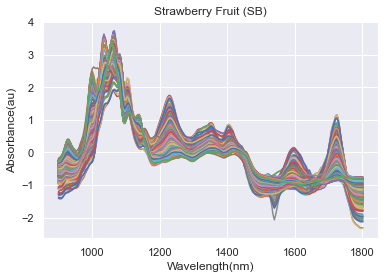

In [4]:
# #add print spectrum...
sns.set_theme()

X1 = df.values[:, 1:].astype('float32')  
y_toc = df.values[:,0]    
wl = np.linspace(900,1802, num=X1.shape[1], endpoint=True)   #wavelength range
plt.plot(wl,X1.T)
plt.title('Strawberry Fruit (SB)', fontsize = 12)
plt.xlabel(r'Wavelength(nm)', fontsize=12)
plt.ylabel('Absorbance(au)', fontsize=12)
plt.savefig('fruit SB.png', dpi=300)
plt.show()

In [5]:
#train set,test set
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=0)  

In [6]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(736, 235, 1)
(736,)
(246, 235, 1)
(246,)


In [7]:
def build_model(hp):  
  model = keras.Sequential([
    keras.layers.Conv1D(
        filters=hp.Int('conv_1_filter', min_value=16, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
        activation='relu',
        input_shape=(F1,1)
    ),
    keras.layers.Conv1D(
        filters=hp.Int('conv_2_filter', min_value=16, max_value=128, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
        activation='relu', name='last_ly'
    ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_3_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
#         activation='relu'
#     ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_4_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_4_kernel', values = [3,5]),
#         activation='relu'
#     ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_5_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_5_kernel', values = [3,5]),
#         activation='relu'
#     ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_6_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_6_kernel', values = [3,5]),
#         activation='relu'
#     ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_7_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_7_kernel', values = [3,5]),
#         activation='relu'
#     ),
#     keras.layers.Conv1D(
#         filters=hp.Int('conv_8_filter', min_value=16, max_value=128, step=16),
#         kernel_size=hp.Choice('conv_8_kernel', values = [3,5]),
#         activation='relu'
#     ),
    keras.layers.MaxPooling1D(pool_size=hp.Int('pool_2_size',min_value=2, max_value=6, step=1)), 
    keras.layers.Flatten(),
    keras.layers.Dense(
        units=hp.Int('dense_1_units', min_value=16, max_value=128, step=16),
        activation='relu'
    ),
    keras.layers.Dense(NC, activation='softmax')
  ])
  
  model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-1, 1e-3])),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy', f1_metric])
  
  return model

In [8]:
from keras_tuner import RandomSearch, Hyperband
from keras_tuner.engine.hyperparameters import HyperParameters

In [9]:
# tuner_search=RandomSearch(build_model,
#                           objective='val_accuracy',overwrite=True,
#                           max_trials=10,directory='output1',project_name="CF classify")
tuner_search=Hyperband(build_model,
                          objective='val_accuracy',overwrite=True,
                          max_epochs=20,directory='output1',project_name="SB classify")

In [10]:
tuner_search.search_space_summary()

Search space summary
Default search space size: 7
conv_1_filter (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 128, 'step': 16, 'sampling': None}
conv_1_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
conv_2_filter (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 128, 'step': 16, 'sampling': None}
conv_2_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
pool_2_size (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 6, 'step': 1, 'sampling': None}
dense_1_units (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 128, 'step': 16, 'sampling': None}
learning_rate (Choice)
{'default': 0.1, 'conditions': [], 'values': [0.1, 0.001], 'ordered': True}


In [11]:
tuner_search.search(X_train, Y_train, epochs=50, validation_split=0.1)
tuner_search.results_summary()

Trial 30 Complete [00h 00m 12s]
val_accuracy: 0.9864864945411682

Best val_accuracy So Far: 0.9864864945411682
Total elapsed time: 00h 03m 27s
INFO:tensorflow:Oracle triggered exit
Results summary
Results in output1\SB classify
Showing 10 best trials
Trial summary
Hyperparameters:
conv_1_filter: 48
conv_1_kernel: 5
conv_2_filter: 80
conv_2_kernel: 5
pool_2_size: 4
dense_1_units: 112
learning_rate: 0.001
tuner/epochs: 20
tuner/initial_epoch: 7
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0014
Score: 0.9864864945411682
Trial summary
Hyperparameters:
conv_1_filter: 32
conv_1_kernel: 5
conv_2_filter: 112
conv_2_kernel: 5
pool_2_size: 6
dense_1_units: 112
learning_rate: 0.001
tuner/epochs: 20
tuner/initial_epoch: 7
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0013
Score: 0.9864864945411682
Trial summary
Hyperparameters:
conv_1_filter: 48
conv_1_kernel: 5
conv_2_filter: 32
conv_2_kernel: 5
pool_2_size: 6
dense_1_units: 80
learning_rate: 0.001
tuner/epochs: 20
tuner/initial_epoch: 0
tun

In [12]:
par=tuner_search.get_best_hyperparameters(1)[0]
print(par.values)

{'conv_1_filter': 48, 'conv_1_kernel': 5, 'conv_2_filter': 80, 'conv_2_kernel': 5, 'pool_2_size': 4, 'dense_1_units': 112, 'learning_rate': 0.001, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0014'}


In [13]:
model=tuner_search.get_best_models(num_models=1)[0]

In [14]:
history=model.fit(X_train, Y_train, epochs=500,validation_split=0.1,  initial_epoch=1)

Epoch 2/500
21/21 [==============================] - 2s 41ms/step - loss: 0.1403 - accuracy: 0.9607 - f1_metric: 0.5235 - val_loss: 0.0732 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 3/500
21/21 [==============================] - 1s 30ms/step - loss: 0.1264 - accuracy: 0.9637 - f1_metric: 0.5339 - val_loss: 0.0614 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 4/500
21/21 [==============================] - 1s 30ms/step - loss: 0.1371 - accuracy: 0.9426 - f1_metric: 0.5327 - val_loss: 0.0605 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 5/500
21/21 [==============================] - 1s 35ms/step - loss: 0.1173 - accuracy: 0.9592 - f1_metric: 0.5339 - val_loss: 0.0530 - val_accuracy: 0.9730 - val_f1_metric: 0.4572
Epoch 6/500
21/21 [==============================] - 1s 41ms/step - loss: 0.1095 - accuracy: 0.9637 - f1_metric: 0.5346 - val_loss: 0.0758 - val_accuracy: 0.9595 - val_f1_metric: 0.4572
Epoch 7/500
21/21 [==============================] - 1s 33ms/step - lo

Epoch 46/500
21/21 [==============================] - 1s 40ms/step - loss: 0.0650 - accuracy: 0.9728 - f1_metric: 0.5339 - val_loss: 0.0178 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 47/500
21/21 [==============================] - 1s 42ms/step - loss: 0.0704 - accuracy: 0.9743 - f1_metric: 0.5334 - val_loss: 0.0647 - val_accuracy: 0.9730 - val_f1_metric: 0.4572
Epoch 48/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0784 - accuracy: 0.9758 - f1_metric: 0.5334 - val_loss: 0.0121 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 49/500
21/21 [==============================] - 1s 32ms/step - loss: 0.0651 - accuracy: 0.9758 - f1_metric: 0.5321 - val_loss: 0.0219 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 50/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0726 - accuracy: 0.9743 - f1_metric: 0.5321 - val_loss: 0.0141 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 51/500
21/21 [==============================] - 1s 31ms/ste

Epoch 90/500
21/21 [==============================] - 1s 43ms/step - loss: 0.0606 - accuracy: 0.9789 - f1_metric: 0.5359 - val_loss: 0.0099 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 91/500
21/21 [==============================] - 1s 46ms/step - loss: 0.0843 - accuracy: 0.9607 - f1_metric: 0.5317 - val_loss: 0.0142 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 92/500
21/21 [==============================] - 1s 41ms/step - loss: 0.0611 - accuracy: 0.9758 - f1_metric: 0.5319 - val_loss: 0.0247 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 93/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0570 - accuracy: 0.9773 - f1_metric: 0.5308 - val_loss: 0.0261 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 94/500
21/21 [==============================] - 1s 36ms/step - loss: 0.0564 - accuracy: 0.9773 - f1_metric: 0.5320 - val_loss: 0.0085 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 95/500
21/21 [==============================] - 1s 37ms/ste

Epoch 134/500
21/21 [==============================] - 1s 30ms/step - loss: 0.0680 - accuracy: 0.9683 - f1_metric: 0.5304 - val_loss: 0.0284 - val_accuracy: 0.9730 - val_f1_metric: 0.4572
Epoch 135/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0560 - accuracy: 0.9773 - f1_metric: 0.5326 - val_loss: 0.0175 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 136/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0407 - accuracy: 0.9879 - f1_metric: 0.5314 - val_loss: 0.0107 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 137/500
21/21 [==============================] - 1s 29ms/step - loss: 0.0499 - accuracy: 0.9864 - f1_metric: 0.5295 - val_loss: 0.0229 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 138/500
21/21 [==============================] - 1s 29ms/step - loss: 0.0452 - accuracy: 0.9864 - f1_metric: 0.5351 - val_loss: 0.0188 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 139/500
21/21 [==============================] - 1s 30

21/21 [==============================] - 1s 41ms/step - loss: 0.0385 - accuracy: 0.9834 - f1_metric: 0.5323 - val_loss: 0.0225 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 178/500
21/21 [==============================] - 1s 36ms/step - loss: 0.0442 - accuracy: 0.9819 - f1_metric: 0.5317 - val_loss: 0.0082 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 179/500
21/21 [==============================] - 1s 36ms/step - loss: 0.0423 - accuracy: 0.9864 - f1_metric: 0.5340 - val_loss: 0.0106 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 180/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0336 - accuracy: 0.9879 - f1_metric: 0.5345 - val_loss: 0.0353 - val_accuracy: 0.9730 - val_f1_metric: 0.4572
Epoch 181/500
21/21 [==============================] - 1s 46ms/step - loss: 0.0445 - accuracy: 0.9834 - f1_metric: 0.5349 - val_loss: 0.0169 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 182/500
21/21 [==============================] - 1s 50ms/step - loss

Epoch 221/500
21/21 [==============================] - 1s 48ms/step - loss: 0.0590 - accuracy: 0.9834 - f1_metric: 0.5333 - val_loss: 0.0160 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 222/500
21/21 [==============================] - 1s 35ms/step - loss: 0.0300 - accuracy: 0.9879 - f1_metric: 0.5328 - val_loss: 0.0046 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 223/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0296 - accuracy: 0.9909 - f1_metric: 0.5346 - val_loss: 0.0074 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 224/500
21/21 [==============================] - 1s 33ms/step - loss: 0.0281 - accuracy: 0.9894 - f1_metric: 0.5368 - val_loss: 0.0031 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 225/500
21/21 [==============================] - 1s 32ms/step - loss: 0.0289 - accuracy: 0.9879 - f1_metric: 0.5332 - val_loss: 0.0146 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 226/500
21/21 [==============================] - 1s 33

21/21 [==============================] - 1s 31ms/step - loss: 0.0734 - accuracy: 0.9728 - f1_metric: 0.5326 - val_loss: 0.0226 - val_accuracy: 0.9730 - val_f1_metric: 0.4572
Epoch 265/500
21/21 [==============================] - 1s 34ms/step - loss: 0.0446 - accuracy: 0.9804 - f1_metric: 0.5367 - val_loss: 0.0110 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 266/500
21/21 [==============================] - 1s 33ms/step - loss: 0.0240 - accuracy: 0.9955 - f1_metric: 0.5361 - val_loss: 0.0023 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 267/500
21/21 [==============================] - 1s 38ms/step - loss: 0.0221 - accuracy: 0.9924 - f1_metric: 0.5340 - val_loss: 0.0049 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 268/500
21/21 [==============================] - 1s 42ms/step - loss: 0.0240 - accuracy: 0.9940 - f1_metric: 0.5357 - val_loss: 0.0023 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 269/500
21/21 [==============================] - 1s 53ms/step - loss

Epoch 308/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0238 - accuracy: 0.9940 - f1_metric: 0.5375 - val_loss: 0.0030 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 309/500
21/21 [==============================] - 1s 37ms/step - loss: 0.0151 - accuracy: 0.9970 - f1_metric: 0.5322 - val_loss: 0.0031 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 310/500
21/21 [==============================] - 1s 34ms/step - loss: 0.0235 - accuracy: 0.9909 - f1_metric: 0.5314 - val_loss: 0.0044 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 311/500
21/21 [==============================] - 1s 35ms/step - loss: 0.0148 - accuracy: 0.9985 - f1_metric: 0.5350 - val_loss: 0.0019 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 312/500
21/21 [==============================] - 1s 32ms/step - loss: 0.0180 - accuracy: 0.9955 - f1_metric: 0.5316 - val_loss: 0.0018 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 313/500
21/21 [==============================] - 1s 28

21/21 [==============================] - 1s 39ms/step - loss: 0.0093 - accuracy: 0.9985 - f1_metric: 0.5335 - val_loss: 0.0014 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 352/500
21/21 [==============================] - 1s 33ms/step - loss: 0.0080 - accuracy: 0.9985 - f1_metric: 0.5339 - val_loss: 0.0024 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 353/500
21/21 [==============================] - 1s 34ms/step - loss: 0.0090 - accuracy: 0.9985 - f1_metric: 0.5363 - val_loss: 0.0015 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 354/500
21/21 [==============================] - 1s 41ms/step - loss: 0.0073 - accuracy: 0.9985 - f1_metric: 0.5327 - val_loss: 0.0058 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 355/500
21/21 [==============================] - 1s 40ms/step - loss: 0.0117 - accuracy: 0.9970 - f1_metric: 0.5330 - val_loss: 0.0051 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 356/500
21/21 [==============================] - 1s 43ms/step - loss

Epoch 395/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0200 - accuracy: 0.9940 - f1_metric: 0.5358 - val_loss: 0.0034 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 396/500
21/21 [==============================] - 1s 32ms/step - loss: 0.0145 - accuracy: 0.9940 - f1_metric: 0.5338 - val_loss: 0.0180 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 397/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0154 - accuracy: 0.9970 - f1_metric: 0.5335 - val_loss: 0.0021 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 398/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0079 - accuracy: 0.9970 - f1_metric: 0.5341 - val_loss: 0.0033 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 399/500
21/21 [==============================] - 1s 30ms/step - loss: 0.0114 - accuracy: 0.9940 - f1_metric: 0.5341 - val_loss: 0.0076 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 400/500
21/21 [==============================] - 1s 30

21/21 [==============================] - 1s 29ms/step - loss: 0.0224 - accuracy: 0.9879 - f1_metric: 0.5301 - val_loss: 0.0134 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 439/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0270 - accuracy: 0.9879 - f1_metric: 0.5292 - val_loss: 0.0031 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 440/500
21/21 [==============================] - 1s 44ms/step - loss: 0.0192 - accuracy: 0.9940 - f1_metric: 0.5339 - val_loss: 0.0889 - val_accuracy: 0.9865 - val_f1_metric: 0.4572
Epoch 441/500
21/21 [==============================] - 1s 41ms/step - loss: 0.0099 - accuracy: 0.9970 - f1_metric: 0.5341 - val_loss: 5.2769e-04 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 442/500
21/21 [==============================] - 1s 40ms/step - loss: 0.0083 - accuracy: 0.9955 - f1_metric: 0.5331 - val_loss: 0.0013 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 443/500
21/21 [==============================] - 1s 43ms/step - 

21/21 [==============================] - 1s 28ms/step - loss: 0.0059 - accuracy: 0.9985 - f1_metric: 0.5360 - val_loss: 9.4668e-04 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 482/500
21/21 [==============================] - 1s 30ms/step - loss: 0.0052 - accuracy: 0.9985 - f1_metric: 0.5342 - val_loss: 0.0015 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 483/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0053 - accuracy: 0.9985 - f1_metric: 0.5336 - val_loss: 6.7649e-04 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 484/500
21/21 [==============================] - 1s 29ms/step - loss: 0.0087 - accuracy: 0.9970 - f1_metric: 0.5328 - val_loss: 0.0011 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 485/500
21/21 [==============================] - 1s 31ms/step - loss: 0.0101 - accuracy: 0.9985 - f1_metric: 0.5290 - val_loss: 8.2344e-04 - val_accuracy: 1.0000 - val_f1_metric: 0.4572
Epoch 486/500
21/21 [==============================] - 1s 28ms

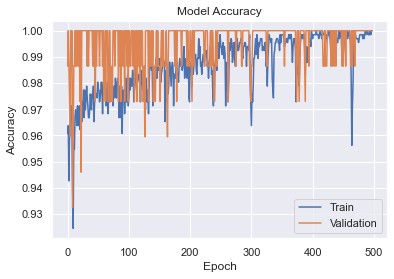

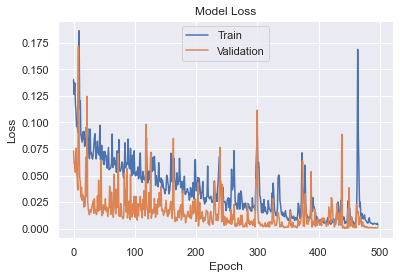

In [15]:
import matplotlib.pyplot as plt
# summarize history for accuracy
plt.plot(history.history['accuracy'][0:-1:1])     #step=10  [start:end:step]
plt.plot(history.history['val_accuracy'][0:-1:1])   #step=10
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best') 
plt.show()
# summarize history for loss 
plt.plot(history.history['loss'][0:-1:1])        #step=10
plt.plot(history.history['val_loss'][0:-1:1])      #step=10
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best') 
plt.show()

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 231, 48)           288       
_________________________________________________________________
last_ly (Conv1D)             (None, 227, 80)           19280     
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 56, 80)            0         
_________________________________________________________________
flatten (Flatten)            (None, 4480)              0         
_________________________________________________________________
dense (Dense)                (None, 112)               501872    
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 226       
Total params: 521,666
Trainable params: 521,666
Non-trainable params: 0
__________________________________________________

In [17]:
from sklearn.metrics import f1_score, accuracy_score
scores1 = model.evaluate(X_train,Y_train,verbose=0)
scores2 = model.evaluate(X_test,Y_test,verbose=0)
Y_pred1 = np.argmax(model.predict(X_train), axis=-1)
Y_pred2 = np.argmax(model.predict(X_test), axis=-1)
print('Train Acc:',"%.2f" % (accuracy_score(Y_train, Y_pred1)*100),'%')
print('Train F1:',"%.2f" % f1_score(Y_train, Y_pred1))
print('Test Acc:', "%.2f" % (accuracy_score(Y_test, Y_pred2) * 100),'%')
print('Test F1:',"%.2f" % f1_score(Y_test, Y_pred2))

Train Acc: 100.00 %
Train F1: 1.00
Test Acc: 99.19 %
Test F1: 0.99


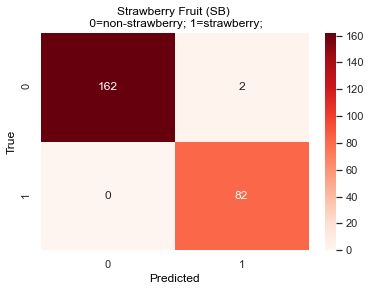

In [18]:
cm1=confusion_matrix(y_true=Y_test, y_pred=Y_pred2 )
sns.heatmap(cm1, annot=True, cmap='Reds', fmt='g')
plt.title('Strawberry Fruit (SB) \n 0=non-strawberry; 1=strawberry;', color= 'black', fontsize=12)
plt.xlabel('Predicted', color= 'black', fontsize=12)
plt.ylabel('True', color= 'black', fontsize=12)
plt.savefig('SB matrices confuse.png', dpi=300, bbox_inches='tight', transparent=False)

In [19]:
end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))

Duration: 0:09:50.815662


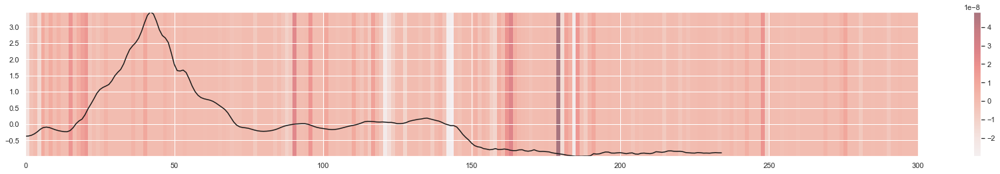

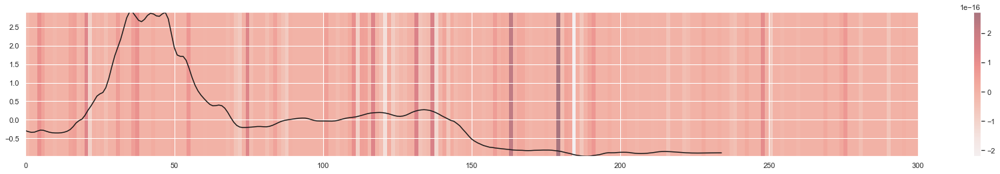

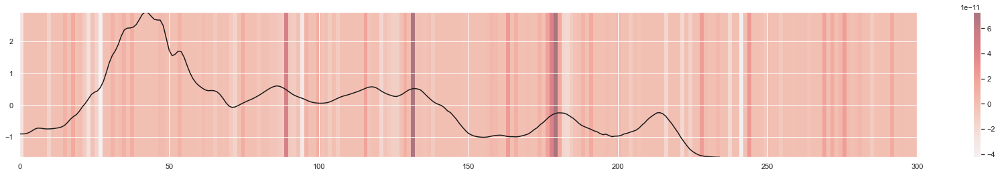

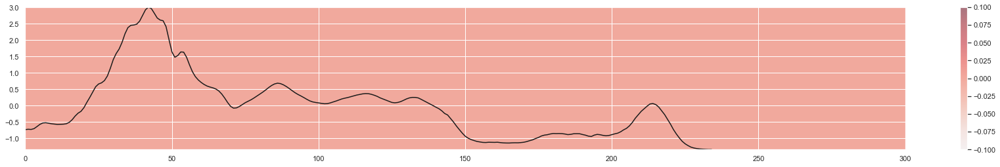

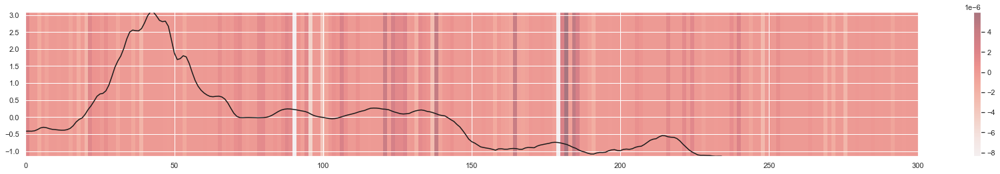

...

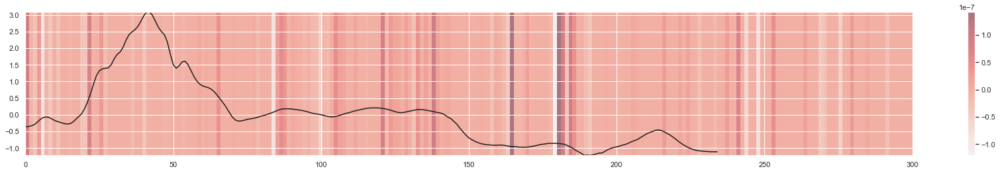

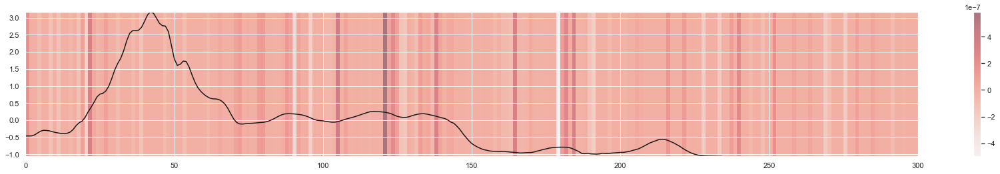

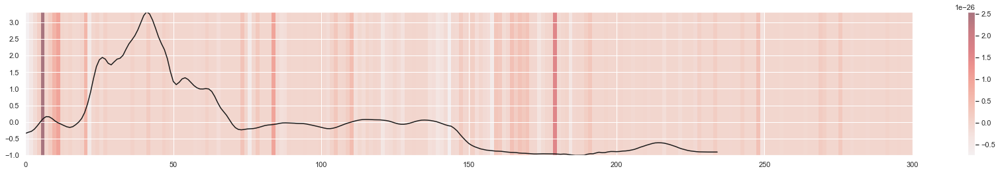

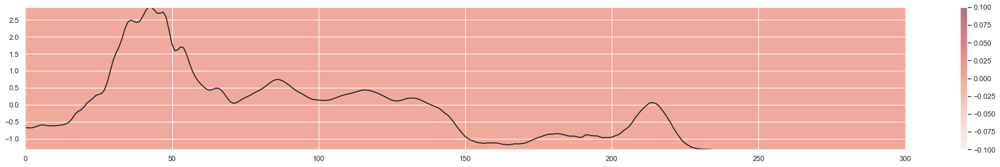

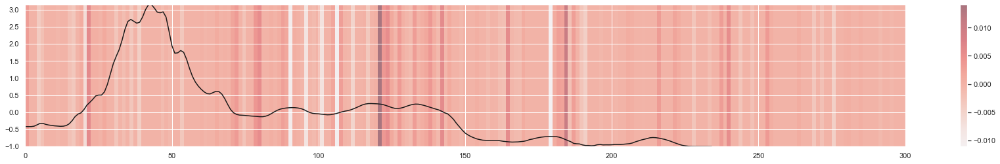

In [20]:
#GRAD-CAM implementation


def grad_cam(layer_name, data):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    last_conv_layer_output, preds = grad_model(data)

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(data)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0))

    last_conv_layer_output = last_conv_layer_output[0]

    heatmap = last_conv_layer_output * pooled_grads
    heatmap = tf.reduce_mean(heatmap, axis=(1))
    heatmap = np.expand_dims(heatmap,0)
    return heatmap

layer_name = "last_ly"
for i in X_test:
    data = np.expand_dims(i,0)
    heatmap = grad_cam(layer_name,data)

    plt.figure(figsize=(30,4))
    plt.imshow(np.expand_dims(heatmap,axis=2),cmap='Reds', aspect="auto", interpolation='nearest',extent=[0,300,i.min(),i.max()], alpha=0.5)
    plt.plot(i,'k')
    plt.colorbar()
    plt.show()